## Summary  

In this task, a generative adversarial network is used to achieve a 4X image super-resolution. A low-resolution image will be input, and the generator will generate a 4X super-resolution image accordingly. SRGAN architecture is used for the generative adversarial network. For training, validating and testing the network, DIV2K data is used. PSNR and SSIM are the main evaluation standards to measure the model quality.  

After implementing SRGAN, testing its architectures and hyperparameters, we in addition implement ESRGAN to compare and contrast the performances. For final models, we run SRGAN and ESRGAN both for 30 epochs. Although SRGAN has higher PNSR and SSIM scores, the artifacts generated by ESRGAN has proved to be more clearer and have more levels of details.  

The parameters and architecture of SRGAN and ESRGAN are:  
1. SRGAN(32 residual blocks, 8 convolutional blocks, image crop size 128);
2. ESRGAN(23 RRDB blocks, 8 convolutional blocks, image crop size 128).

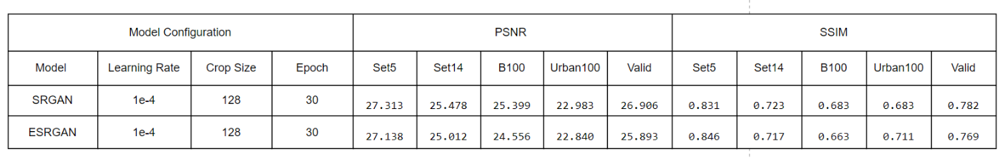  

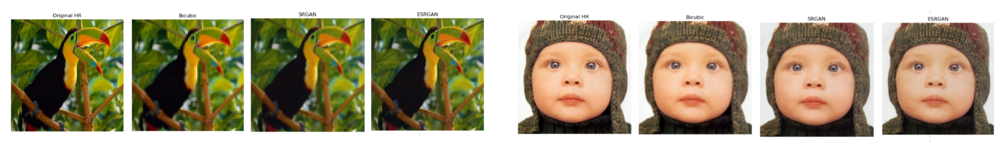  

Although ESRGAN generally has lower PSNR and SSIM scores on all validation and test dataset, its generated artifacts has more levels of details compare to SRGAN’s results. This is because the calculation methods of PSNR and SSIM are both slightly biased towards over-smoothed(blurry) results. ESRGAN’s artifacts afford more effort trying to reconstruct objects’ outlines, layering, and textures.  

There are also limitations on reconstructing small area objects' textures and outlines. The particle size of learning, extracting and reconstructing fine-grained images are difficult with SRGAN and ESRGAN. This seems to be affected by the image crop size and the convolution kernel size. Large crop sizes and convolution kernel sizes can lead to coarse-grained images, whilst too small sizes can also make the model miss details.  

For further investigation, we could test different kernel sizes, crop sizes and even batch sizes. We could also try applying adaptive sparse domain selection and adaptive regularization.  

In [1]:
import time
import torch.backends.cudnn as cudnn
from torch import nn
from easydict import EasyDict as edict
from models import Generator, Discriminator, TruncatedVGG19
from datasets import SRDataset
from utils import *
from solver import train

import matplotlib.pyplot as plt
import numpy as np

In [2]:
# config
config = edict()
config.csv_folder = './data/SRDataset/'
config.HR_data_folder = './data/SRDataset/div2k/DIV2K_train_HR/'
config.LR_data_folder = './data/SRDataset/div2k/DIV2K_train_LR_bicubic/X4/'
config.crop_size = 128
config.scaling_factor = 4

# Generator parameters
config.G = edict()
config.G.large_kernel_size = 9
config.G.small_kernel_size = 3
config.G.n_channels = 64
config.G.n_blocks = 32

# Discriminator parameters
config.D = edict()
config.D.kernel_size = 3
config.D.n_channels = 64
config.D.n_blocks = 8
config.D.fc_size = 1024

# Learning parameters
config.checkpoint = None # path to model (SRGAN) checkpoint, None if none
config.batch_size = 16
config.start_epoch = 0
config.epochs = 50
config.workers = 4
config.vgg19_i = 5  # the index i in the definition for VGG loss; see paper
config.vgg19_j = 4  # the index j in the definition for VGG loss; see paper
config.beta = 1e-3  # the coefficient to weight the adversarial loss in the perceptual loss
config.print_freq = 50
config.lr = 1e-4

# Default device
config.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cudnn.benchmark = True

## 1. Implementation of SRGAN
The architecture diagrams in the SRGAN paper is thorough enough for implementing a PyTorch version of this network. We also referenced git repositories “tensorlayer/SRGAN” and “leftthomas/SRGAN” for more details.  


### 1.1 Generator  
The generator architecture of the SRRESNET generator network consists of the low-resolution input, which is passed through an initial convolutional layer of 9×9 kernels and 64 feature maps followed by a Parametric ReLU layer. The next layer of the feed-forward fully convolutional SRRESNET model utilizes a bunch of residual blocks. Each of the residual blocks contains a convolutional layer of 3×3 kernels and 64 feature maps followed by a batch normalization layer, a Parametric ReLU activation function, another convolutional layer with batch normalization, and a final element wise sum method. The element wise sum method uses the feed-forward output along with the skip connection output for providing the final resulting output. Once construction finishes from the residual-blocks layer, we make use of the pixel shuffler in this generator model architecture after the 4x upsampling of the convolutional layer to produce the super-resolution images. The pixel shufflers take values from the channel dimension and stick them into the height and width dimensions.  
Parametric ReLU is used as the base activation function. The advantage being we can let the neural network choose the best value by itself, and is hence preferred in this scenario.  
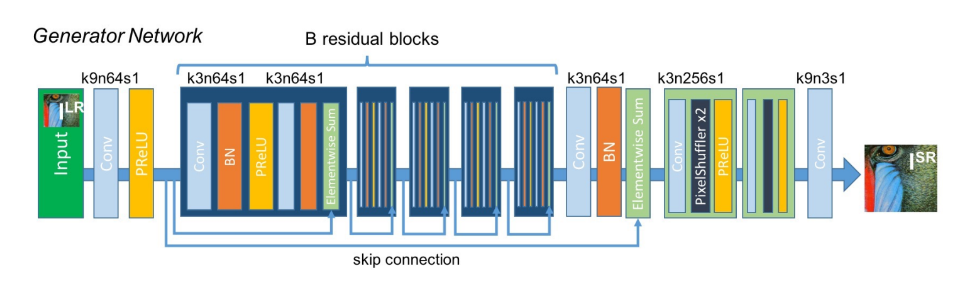  

Below are code snippets for constructing a residual block and an upsample block for pixel shuffling and extending the image to higher-resolution.
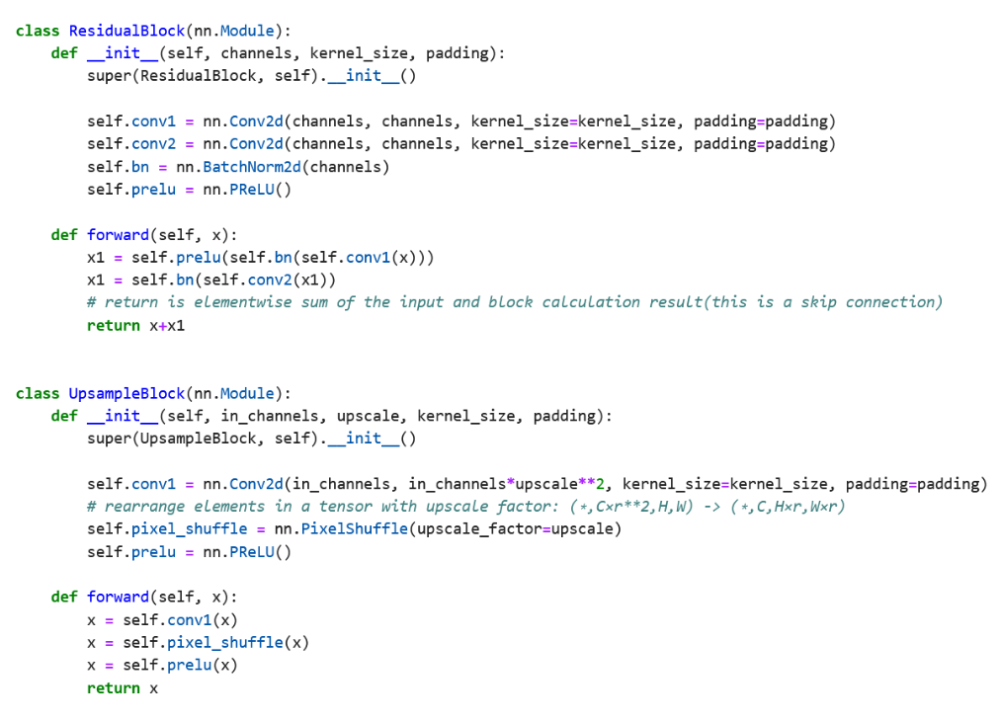    

We enable a way to change the residual block amount for the generator. Below are the code snippets to put the residual blocks and upsample blocks together.  
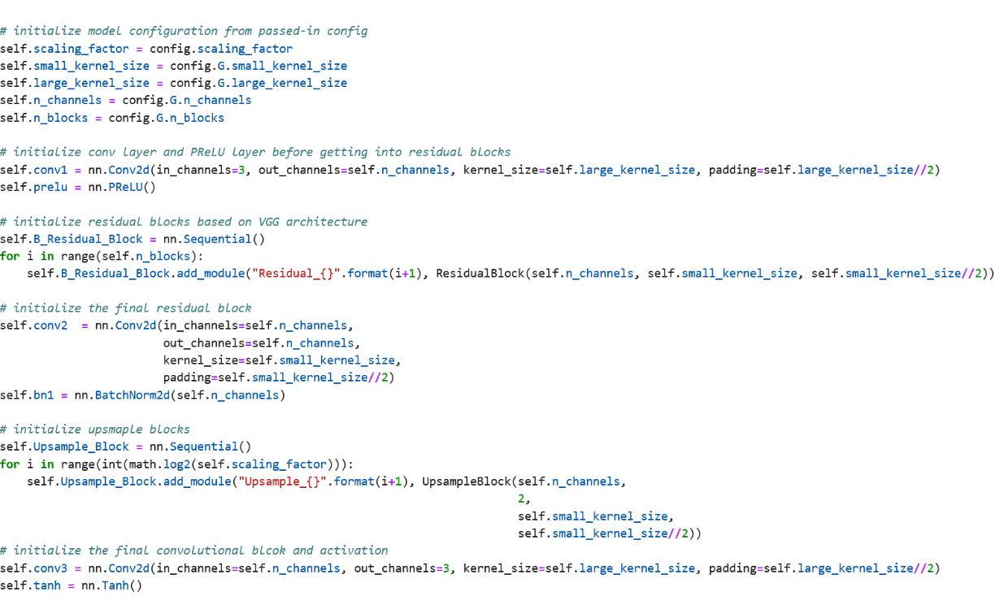  

One thing needed to notice is that we also allow constructing the architecture with different amounts of upsampling blocks. The amount of the upsample blocks is closely related to the scaling factor of super-resolution. For example, if we want the image to be extended to 4X resolution, the scaling factor will be 4, and therefore, we need 2 upsampling blocks inside the architecture.  


### 1.2 Discriminator  
The discriminator architecture is constructed in the best way to support a typical GAN procedure. Both the generator and discriminator are competing with each other, and they are both improving simultaneously. While the discriminator network tries to find the fake images, the generator tries to produce realistic images so that it can escape detection from the discriminator.  
Unlike the generator, the base activation for the discriminator is Leaky ReLU. The discriminator network consists mostly of convolutional blocks, with different stride and output channel amount. After completing all the convolutional blocks, the data is fetched into 2 dense layers(FC) and finally activated by Sigmoid function.  
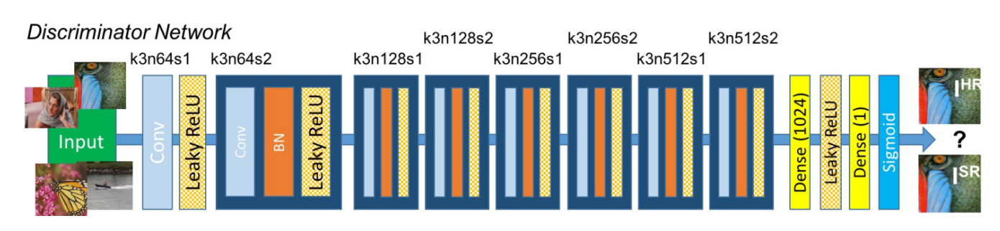  

Below is the code snippet for a convolutional block.  
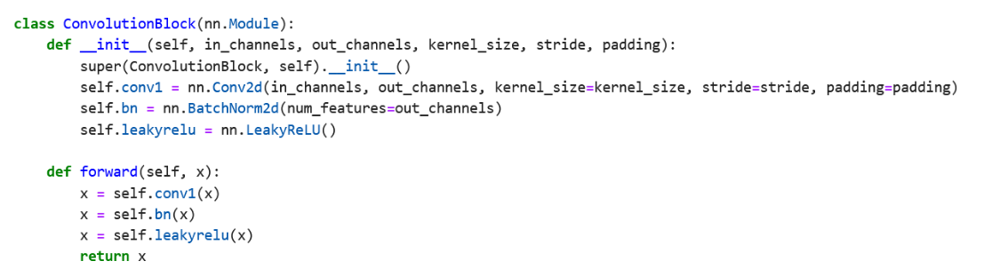  

Same as the generator, we provided ways to initialize a discriminator with different amounts of convolutional blocks.  
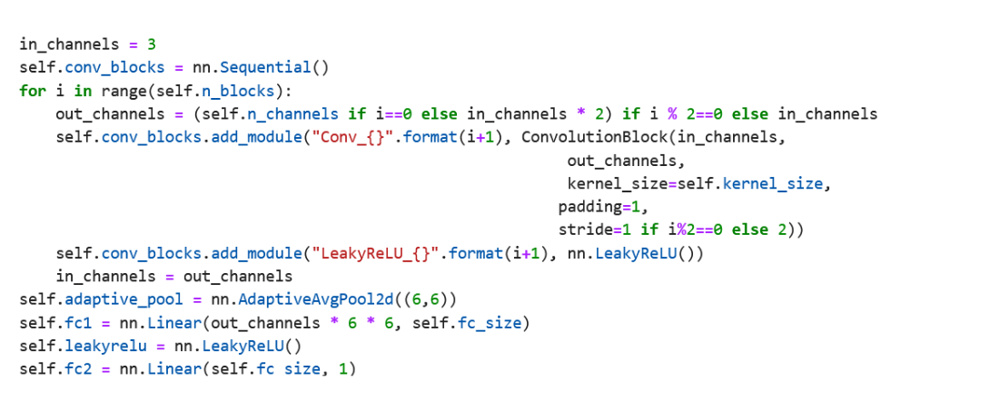  


### 1.3 Truncated VGG19  
The truncated VGG19 is used for loss calculation. The SRGAN paper proposes a loss function that assesses a solution with respect to perceptual relevant characteristics.  
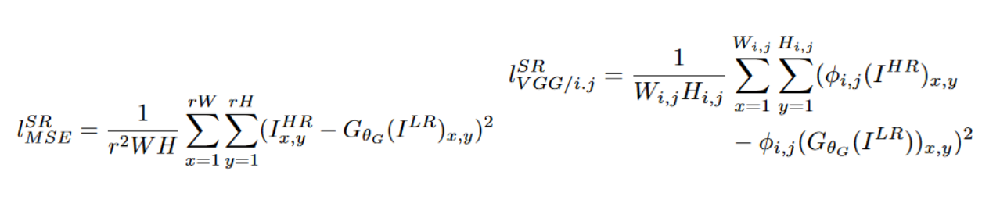   

Above is the calculation of content loss. The MSE loss on the image feature space is referred to as VGG loss, which is based on the pre-trained VGG to extract image features. i,j is to get the feature map from after the jth convolutional layer(including activation) and before the ith max pooling layer.  
In adversarial learning, the high-resolution image generated by the generator should be as close as possible to the real high-resolution image and be able to trick the discriminator into identifying it as a real high-resolution image; the discriminator should try to be as close as possible to the generated high-resolution image and the real high-resolution image. The formula for adversarial loss is:  
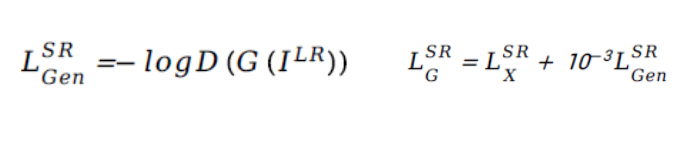  


### 1.4 Generator for ESRGAN
The architecture is described by an online article “ESRGAN : Enhanced Super Resolution GAN”. It is by its name, an enhanced version of the traditional SRGAN. The overall high-level architecture design of the network is retained but few new concepts are added and changed which ultimately lead to increase in efficiency of the network. The first change is to remove all the batch normalization layers from the SRGAN architecture. It has been observed that removal of BN layers leads to increase in performance and reduction of computation complexity and memory usage in many network architectures. Another change is to replace the residual block with a concept called Residual in Residual Dense Block.  
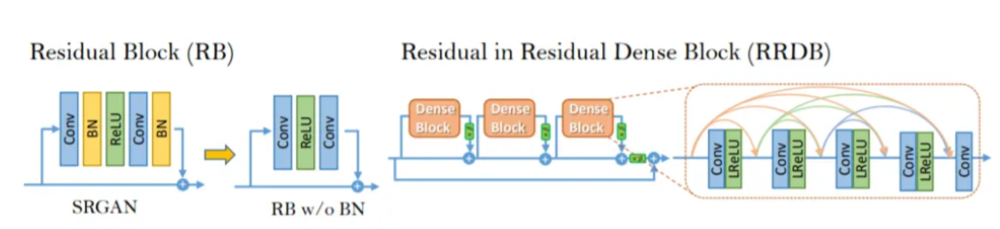  

As can seen from the diagram above, the RRDB block is much deeper and offers a more complex structure than the base residual block in SRGAN. This ultimately boosted the performance of the network.  
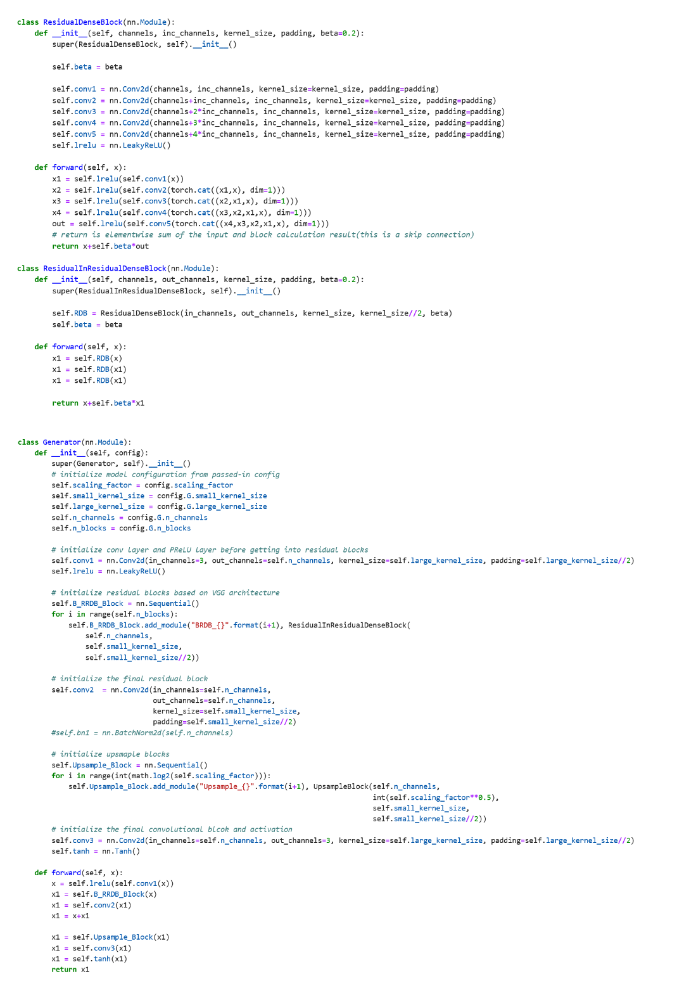


## 2. Model Architecture Adjustment
Once we made sure that the configurations in the original SRGAN paper can be run successfully, we starts to change the residual block amount in the generator and the convolutional block  amount for the discriminator.  


### 2.1 Model Evaluation - PSNR
Peak signal-to-noise ratio (PSNR) is an engineering term for the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation. It is commonly used to quantify the construction quality of images and videos. Typical values for the PSNR in lossy image and video compression are between 30 and 50 dB, where higher is better. Values over 40 dB are normally considered very good and those below 20 dB are normally unacceptable.  


### 2.2 Model Evaluation - SSIM  
The structural similarity index measure (SSIM) is a method for predicting the perceived quality of digital television and cinematic pictures, as well as other kinds of digital images and videos. SSIM is used for measuring the similarity between two images. The SSIM index is a full reference metric; in other words, the measurement or prediction of image quality is based on an initial uncompressed or distortion-free image as reference. 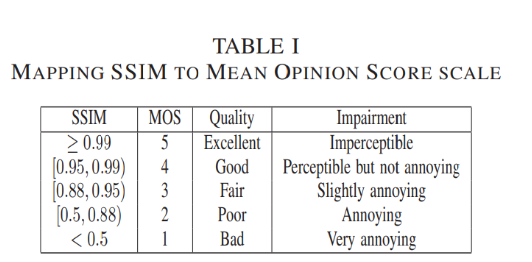  


### 2.3 Generator Residual Block Amount

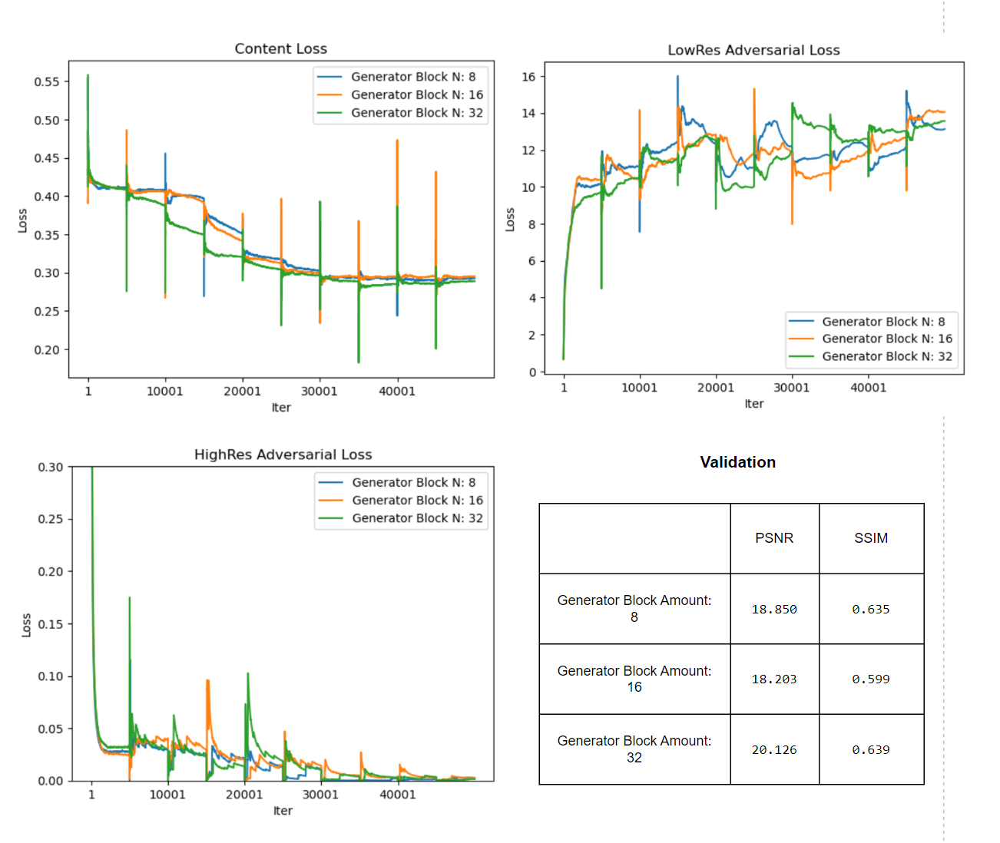  

We set the batch size to 16, crop size to 96, and 10 epochs for this section. The learning rate is extreme small(1e-5) to avoid too aggressive changes or overfitting in this testing session. The discriminator has 8 convolutional blocks.   
We tested generators with 8, 16, and 32 base residual blocks. The larger the block amount is, the more complex the network will be. A complex model can capture more nuances and patterns in the data, but it can also be more prone to overfitting, which means it learns too much from the noise and fails to generalize to new data. A simple model can be more robust and efficient, but it can also be more prone to underfitting, which means it learns too little from the data and misses important relationships.  

<i>Observations:</i>  
1. The network converges faster with greater residual block amount.
2. The content loss clearly implies that the current learning rate is too small, since it takes much time to find an optimal way to decrease the loss. We will tune the learning rate value in the later session.
3. The adversarial loss on high resolution images(that is the loss with the discriminator) decreases rapidly and approaches to 0.0 at the end epochs. Generally speaking, it is not ideal if a discriminator has its loss get too close to zero. When this loss is too low, that would mean that the discriminator is doing a too good job (and most importantly, the Generator a too bad one), ie. it can easily discriminate between fake and real data (ie. the generators' creations are not close enough to real data).
4. As the low resolution adversarial loss goes up, the discriminator loss follows a downward trend. This is the collab trend suggesting the model is working at least, implying the model successfully generates images that your discriminator finds difficult to catch.
5. Three models with different amounts of base residual blocks are close. This is potentially also caused by a small learning rate. Since all networks are learning slowly within the given max iteration.
6. From the validation set, the best performance is with 32 residual blocks in the generator. It has the highest PSNR and highest SSIM. A generator with 8 blocks is the second best. We will test these 2 settings with different discriminator structures in the later session.

### 2.4 Discriminator Convolutional Block Amount

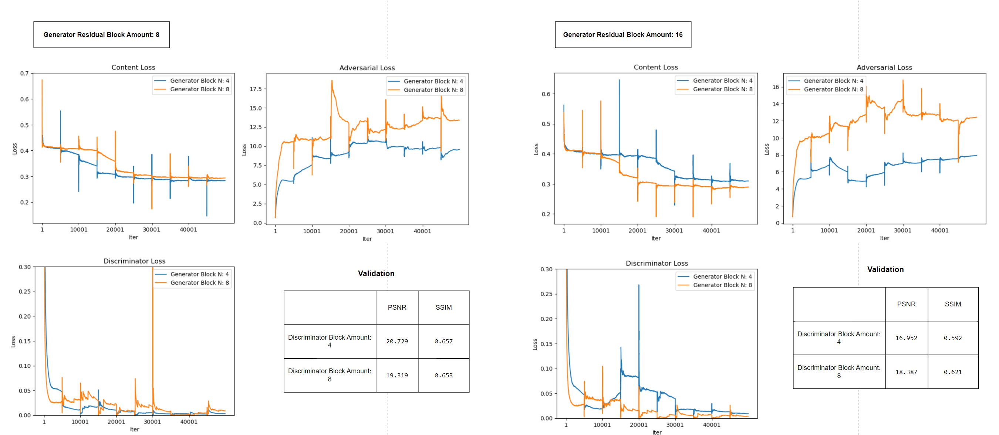  

The original plan is to test discriminators with 4, 8, or 16 convolutional blocks. However, with 16 convolutional blocks, the CUDA gpu ran out of memory, therefore we only tested 4 and 8 convolutional blocks. Hyperparamter settings remain the same as in Section 2.3.  

<i>Observations:</i>
1. Generator with 8 Residual Blocks:
   * The model’s better performance is when the convolution block amount is set to 4 in the discriminator.  
   * The above architecture has faster convergence compared to 8-convolutional-block discriminator. It also has slightly higher PSNR and SSIM on the validation set after 10 epochs of training.  
2. Generator with 32 Residual Blocks:
   * The model performs better when the discriminator has 8 convolutional blocks.
   * A discriminator with 8 convolutional blocks converges faster than a discriminator with only 4 convolutional blocks. Although, the optimization with 8 convolutional blocks is much more stable than the 4-block one.
   * There exists a more obvious difference between these two tested models on PSNR and SSIM scores.  
3. Judging by the performance on the validation set, “8-Block Generator + 4-Block Discriminator”(referred as Model.A in this section)’s training result is of higher quality than “32-Block Generator + 8-Block Discriminator”(referred as Model.B in this section). This could potentially be caused by the learning curve being longer on the later model. This opinion can be verified by observing the convergence of a model. Model. A converges at around 20000 iterations and Model.B converges at around 25000-30000 iterations, with a much higher content loss after converging.
4. Still, at this point, neither model has provided ideal learning results. As mentioned in Section 2.3, the learning rate is too small that introduces a negative impact on the model. We will use Model.A and Model.B in the later section to tune the learning rate value.

## 3. Model Parameter Tuning  
Due to the limitation of time, we will only test how learning rates and random image crop sizes can affect the model learning results and the artifacts of the generated super-resolution images. 


### 3.1 Learning Rate

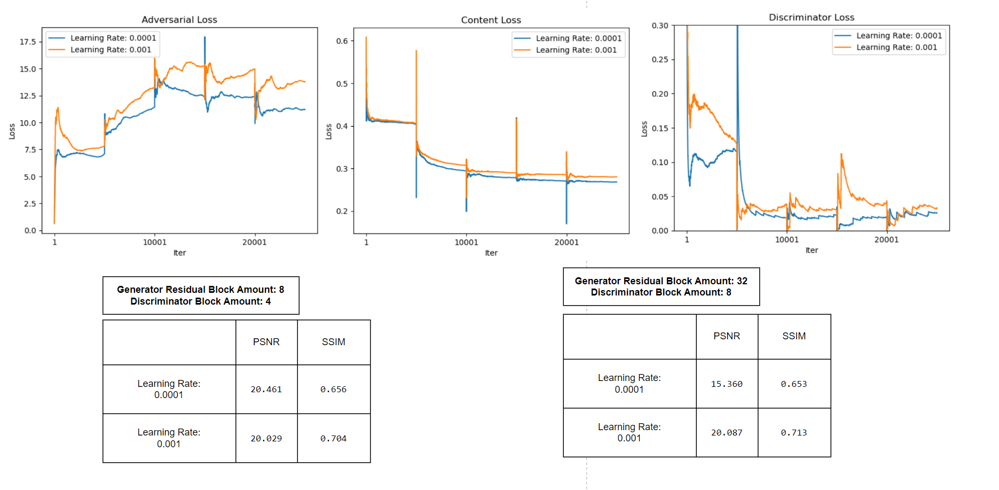  

As discussed in Section 2, using 1e-6 as the learning rate clearly is too small to bring a positive impact on the model learning. We will test larger learning rates: 1e-5, 1e-4.   
We will refer to the  SRGAN with 8 residual blocks and 4 convolutional blocks as model.A, and refer to the  SRGAN with 32 residual blocks and 8 convolutional blocks as model.B in the discussion. The learning curve diagrams are generated from the training log of model A. Model B has similar curve trends, so its log diagrams will be omitted here.  
Also to be noted, we only tested 5 epochs for each model to save the parameter tuning time spent.  

<i>Observations:</i>
1. After increasing the learning rate to 1e-5, the model’s content loss and discriminator loss curves start to follow a more ideal elbow shape.  
2. When the learning rate is set to 1e-5, model.A has slightly higher SSIM and much higher PSNR than model.B; When the learning rate is 1e-4, model.B is better than model.A. A reason could be model.B is slower to converge, due to its model complexity. With higher learning rates, it starts to get better learning results whilst model.A at the same, already finished convergence, and may even overfitting.  
3. Although model.A has slightly higher PNSR scores when the learning rate is 1e-5, its SSIM becomes much lower than with learning rate 1e-4.  
4. Based on the analysis, we will use 1e-4 as the learning rate when experimenting with the image random crop size.  

### 3.2. Image Crop Size
It is addressed in the original paper, “For each mini-batch we crop random 96 × 96 HR sub images of distinct training images. Note that we can apply the generator model to images of arbitrary size as it is fully”. We cannot directly resize images to 32x32 and/or 128x128 as this would affect the spatial properties. The ideal way is to crop a section from the original tile that has dimensions of factors 128 and 32. This way the pixel relation is maintained and the model can learn how to upsample a single pixel 4 times. Finally, we were able to generate thousands of samples using augmentation by flipping and rotating the images. We run 8 epochs for each model.  

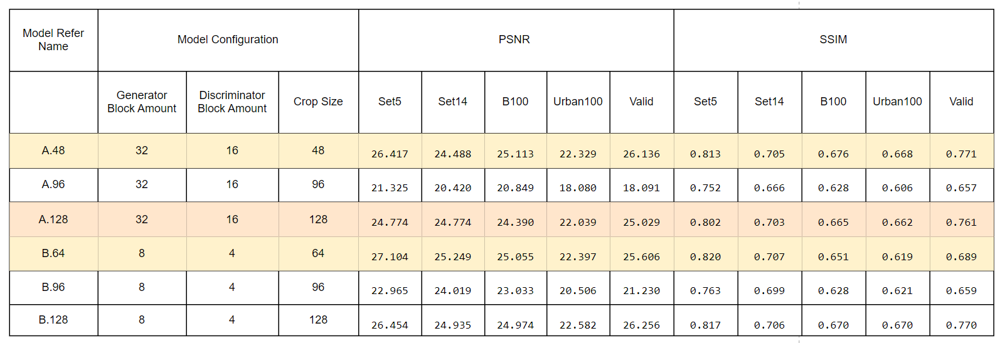  

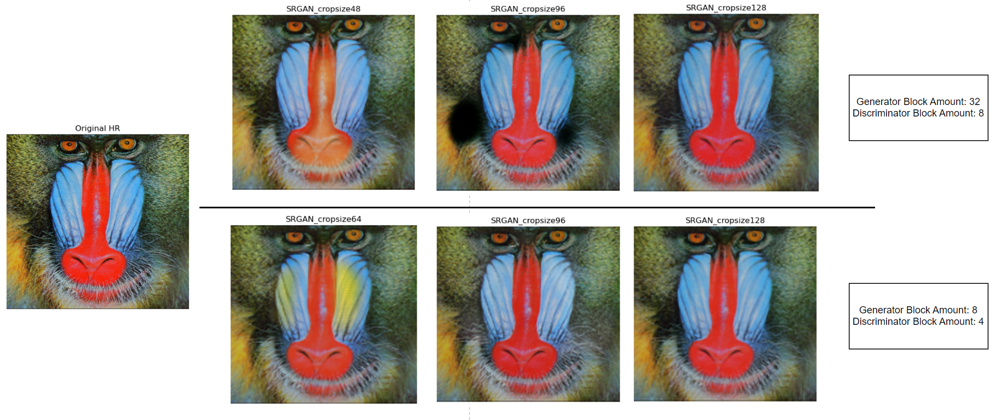  
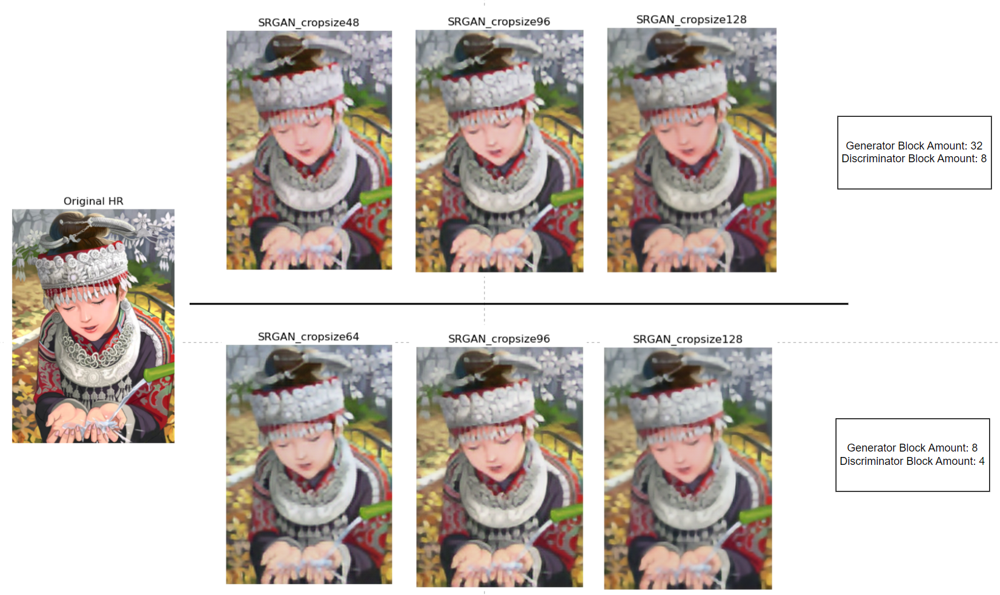  

<i>Observations:</i>  
1. Models with crop size 96 have the worst performances, compared to any larger or smaller crop size we tested.
2. For the datasets we run evaluation, Set5 usually has the highest PSNR and the highest SSIM. Urban100 usually has the lowest scores. This could be due to that in the training set, not much data is related to the features in Urban100.
3. Three highlighted models have ideal performances. The one colored in red has close scores on each tested dataset, whilst for others, scores on different datasets can have some outlier cases, take the Urban100’s scores for example. Therefore, we select this model as our final model, because we don’t want a model that has extremely good performances on some data, and extremely bad ones on other data.
4. Above we attached some generated artifacts on the Set14 data. Overall, the generated images fail to fill in textures and are missing a level of details. The super-resolution images all look blurry. For the final model, more iterations are needed to learn about texture features and to produce images that are clearer.
   * Less texture details are revealed when the crop size is set to 128. When the crop size is 48 or 64, more texture details are generated. Take the fur on the baboon’s cheek as an example.
   * Although small crop sizes have a more guaranteed PSNR and SSIM scores, it can have “over-exposed” artifacts on the generated images, that is, the model fails to perform on parts that are much brighter than the surroundings. Also, for these brighter areas, they can appear graininess(pixelized), for example, the baboon nose with 64 crop size(8 residual blocks and 4 convolutional blocks), and the bamboo for the comic girl image. An inference could be made that the crop size has a huge impact on how detailed the textures can be extracted, learnt, and regressed to the generated image. The larger the crop size is, the more difficult it is to get detailed textures.

## 4. Final Models: SRGAN vs ESRGAN  

With the conclusion from Section 3 and 4, we will use: 32 residual blocks, 8 convolutional blocks, learning rate 1e-4 and crop size 128 for our SRGAN model. For ESRGAN, we set the RRDB block amount in the generator to 23, the same as the original paper described. To compare these two models, we will compare the PSNR and SSIM scores, as well as the generated artifacts on Set14 from a state of art perspective.

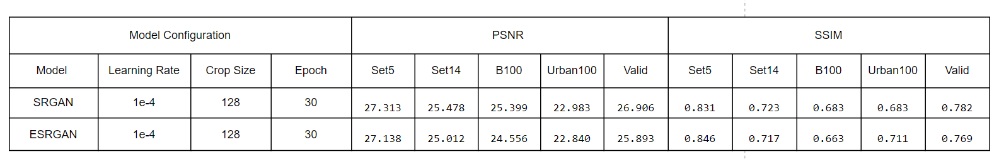   

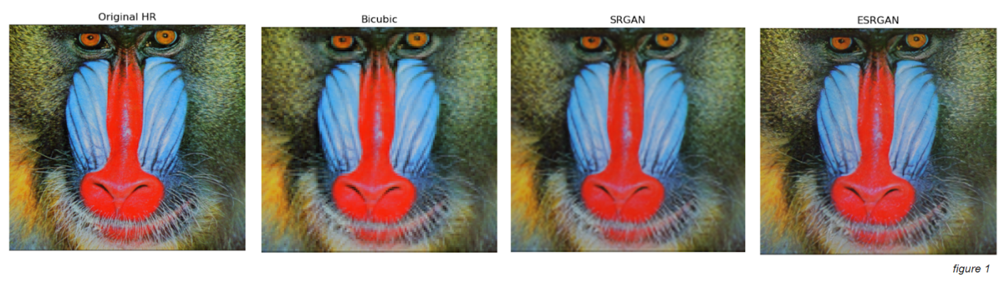  

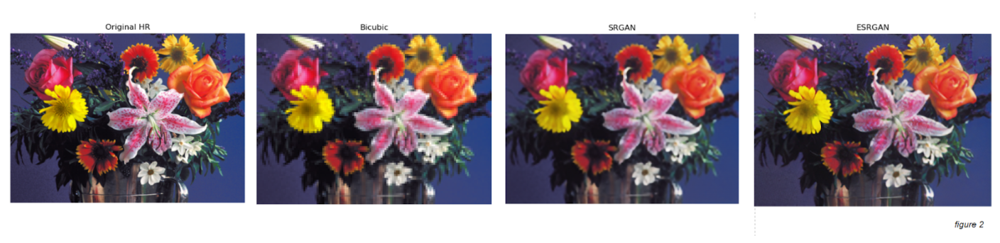  

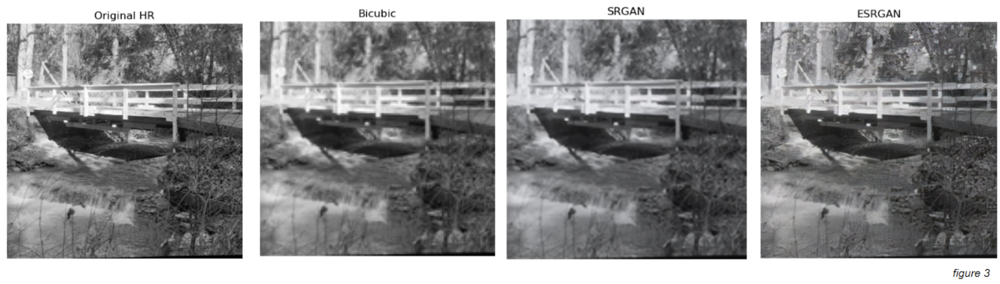  

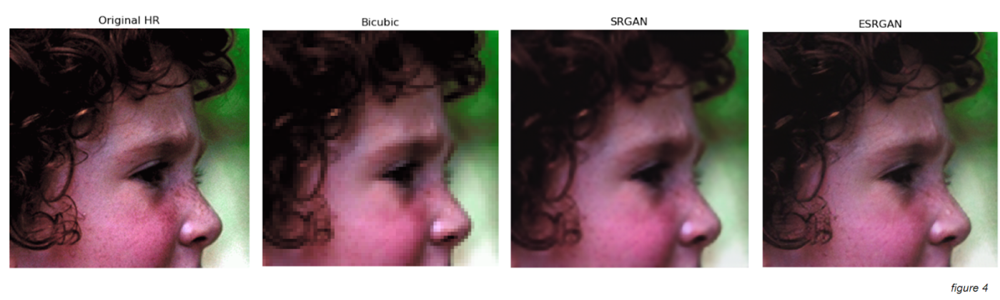  

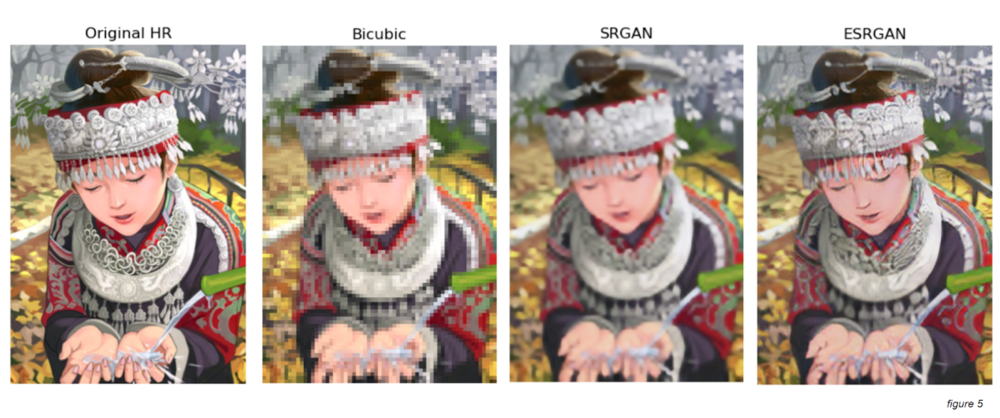  

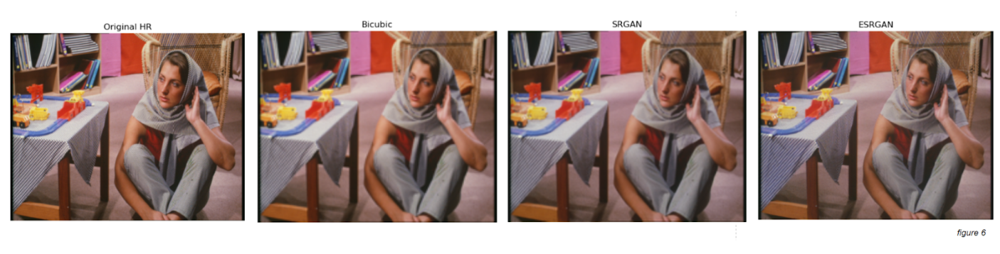  

<i>Observations:</i>  
1. After 30 epochs(5000 iterations per epoch), SRGAN has a much higher PNSR and SSIM scores than the ESRGAN, across all the datasets we used for validation and test.
2. The SRGAN generated images are more close to the artifacts of Bicubic algorithm, whilst the ESRGAN generated images are more close to the original high resolution images, especially the reconstruction of material and texture details.
3. Higher PNSR means more noise removed, however, as a least squares result, it is slightly biased towards over smoothed(blurry) results. SSIM has similar bias, but also takes into account the similarity of edges(high frequency contents). This to some extent explains why images generated by ESRGAN are clearer in details, but has PNSR and SSIM evaluation indicators are not good enough. On the other hand, SRGAN images are more blurry, but have much fewer noises.
4. SRGAN vs ESRGAN on artifacts:
   * Using baboon fur on cheeks(figure 1) as example, SRGAN fails to restore the layering details of animal hair. The picture generated by ESRGAN has the texture and layers of hair clusters. However, the texture is not detailed enough and appears blocky in small areas.  
   * From figure 2, we could see that ESRGAN can better distinguish the stimulus areas in areas with similar colors. An example is the orange rose on the right corner. Each petal of it is well distinguished from other petals by ESRGAN. However, in the results of SRGAN, especially in the center of the flower, the petals are not well separated. This loss of detail can also be seen from figure 3, under a similar grayscale, SRGAN could not distinguish the tree in the right bottom foreground from the grass and rock behind it.  
   * Due to the bias slightly towards over-smooth, SRGAN also fails to generate crisp boundaries(edges), whilst ESRGAN does a better job. Outlines of the curly hair on the sideburns in figure 4 proves this conclusion well.  
   * With all the analysis above, it does not mean ESRGAN has no disadvantages. Take a closer look at: a. Figure 3 bottom right tree, b. Figure 5 textures on the necklace and hat. Although ESRGAN has constructed far more details to these two, serious distortion also happens in these two areas. The distortion happens because the feed-in data(low resolution images used to generate HR images here) has too few pixels to contain enough information, therefore, although the model has the capability of reconstructing details, it does not know what kind of details need to be constructed. An assumption is that with more data and training iteration, the model could potentially learn and memorize more on different types of textures and how and when to use these textures when reconstructing.
   * Figure 6 has an interesting phenomenon. Bicubic, SRGAN and ESRGAN all fail to recover the black and white plaid on the woman’s cloth. After checking the low resolution image used in figure 6, we found out that the low-resolution image does not contain any plaid-like information. We can make a conclusion that although the model can learn about textures and fill them into the image in the construction stage, it will find it hard to reconstruct the information that is originally not in the low resolution images.
   * From figure2, figure3 and  figure 5, we could see that both SRGAN and ESRGAN has better reconstruction capability on foreground objects, but weaker on background objects(objects that are far from the camera).


## 5. Code Snippets of Training

In [ ]:
print("generator block amount: {}".format(config.G.n_blocks))
print("discriminator block amount: {}".format(config.D.n_blocks))
print("crop size: {}".format(config.crop_size))
print("learning rate: {}".format(config.lr))

# initialize generator and discriminator
if config.checkpoint is None:
    # Generator
    generator = Generator(config)

    # Initialize generator's optimizer
    optimizer_g = torch.optim.Adam(params=filter(lambda p: p.requires_grad, generator.parameters()),lr=config.lr)
    #optimizer_g = torch.optim.SGD(generator.parameters(), lr=config.lr)

    # Discriminator
    discriminator = Discriminator(config)
    optimizer_d = torch.optim.Adam(params=filter(lambda p: p.requires_grad, discriminator.parameters()),lr=config.lr)
    #optimizer_d = torch.optim.SGD(discriminator.parameters(), lr=config.lr)

else:
    checkpoint = torch.load(config.checkpoint)
    config.start_epoch = checkpoint['epoch'] + 1
    generator = checkpoint['generator']
    discriminator = checkpoint['discriminator']
    optimizer_g = checkpoint['optimizer_g']
    optimizer_d = checkpoint['optimizer_d']
    print("\nLoaded checkpoint from epoch %d.\n" % (checkpoint['epoch'] + 1))

# initialize loss
truncated_vgg19 = TruncatedVGG19(i=config.vgg19_i, j=config.vgg19_j)
truncated_vgg19.eval()
content_loss_criterion = nn.MSELoss()
adversarial_loss_criterion = nn.BCEWithLogitsLoss()

# move to gpu
generator = generator.to(config.device)
discriminator = discriminator.to(config.device)
truncated_vgg19 = truncated_vgg19.to(config.device)
content_loss_criterion = content_loss_criterion.to(config.device)
adversarial_loss_criterion = adversarial_loss_criterion.to(config.device)

# train data loader
train_dataset = SRDataset(split='train', config=config)
train_loader = torch.utils.data.DataLoader(train_dataset,
                                           batch_size=config.batch_size,
                                           shuffle=True, 
                                           num_workers=config.workers,
                                           pin_memory=True)

# train
# Epochs
train_loss_c = []
train_loss_a = []
train_loss_d = []
for epoch in range(config.start_epoch, config.epochs):
    # At the halfway point, reduce learning rate to a tenth
    #if epoch == int(config.epochs / 2 + 1):
    if epoch%10==0 and epoch!=0: 
        adjust_learning_rate(optimizer_g, 0.5)
        adjust_learning_rate(optimizer_d, 0.5)
    # One epoch's training
    average_loss_c, average_loss_a, average_loss_d = train(train_loader=train_loader,
          generator=generator,
          discriminator=discriminator,
          truncated_vgg19=truncated_vgg19,
          content_loss_criterion=content_loss_criterion,
          adversarial_loss_criterion=adversarial_loss_criterion,
          optimizer_g=optimizer_g,
          optimizer_d=optimizer_d,
          epoch=epoch,
          device=config.device,
          beta=config.beta,
          print_freq=config.print_freq)
    # concatenate per-epoch training logs
    train_loss_c += average_loss_c
    train_loss_a += average_loss_a
    train_loss_d += average_loss_d
    # Save checkpoint
    torch.save({'epoch': epoch,
                'generator': generator,
                'discriminator': discriminator,
                'optimizer_g': optimizer_g,
                'optimizer_d': optimizer_d},
                'checkpoint_srgan_epoch_{}.pth.tar'.format(epoch))

## 6. Conclusion  

The learning process of the SRGAN model is a process of trying to find a balance between the generator and the discriminator. In other words, we are trying to find the optimal solutions that can balance out the adversarial loss and the content loss from the generator with the discriminator’s loss. For example, with a model that has discriminator loss approaching to 0.0 quickly whilst leaving the generator’s loss still converging, the generator is usually considered to be too weak to accomplish the training task.  

After adjusting the model architecture and its hyperparameter, the best performing model we tested is with 32 residual blocks in the generator, 8 convolutional blocks in the discriminator, and image crop size set to 128. For Set5 data, the one we use for generating images for human review, SRGAN has a PSNR at 27.313 and a SSIM at 0.831. We in addition implemented ESRGAN with the same convolutional block amount and the same image crop size. Its PSNR is 27.138 and SSIM is 0.846 on Set5. Although ESRGAN generally has lower PSNR and SSIM scores on all validation and test dataset, its generated artifacts has more levels of details compare to SRGAN’s results. This is because the calculation methods of PSNR and SSIM are both slightly biased towards over-smoothed(blurry) results. ESRGAN’s artifacts afford more effort trying to reconstruct objects’ outlines, layering, and textures.  

There are also limitations on reconstructing small area objects' textures and outlines. The particle size of learning, extracting and reconstructing fine-grained images are difficult with SRGAN and ESRGAN. This seems to be affected by the image crop size and the convolution kernel size. Large crop sizes and convolution kernel sizes can lead to coarse-grained images, whilst too small sizes can also make the model miss details.  

For further investigation, we could test different kernel sizes, crop sizes and even batch sizes. We could also try applying adaptive sparse domain selection and adaptive regularization.
